# Image Generation
## Introduction
The Images API provides three methods for interacting with images:

1. Creating images from scratch based on a text prompt (DALL·E 3 and DALL·E 2)
2. Creating edited versions of images by having the model replace some areas of a pre-existing image, based on a new text prompt (DALL·E 2 only)
3. Creating variations of an existing image (DALL·E 2 only)

## Generations
The [image generations endpoint](https://platform.openai.com/docs/api-reference/images/create) allows you to create an original image given a text prompt. When using DALL·E 3, images can have a size of 1024x1024, 1024x1792 or 1792x1024 pixels.

By default, images are generated at standard quality, but when using DALL·E 3 you can set quality: "hd" for enhanced detail. Square, standard quality images are the fastest to generate.

You can request 1 image at a time with DALL·E 3 (request more by making parallel requests) or up to 10 images at a time using DALL·E 2 with the n parameter.

Each image can be returned as either a URL or Base64 data, using the response_format parameter. URLs will expire after an hour.

### Prompting
With the release of DALL·E 3, the model now takes in the default prompt provided and automatically re-write it for safety reasons, and to add more detail (more detailed prompts generally result in higher quality images).

While it is not currently possible to disable this feature, you can use prompting to get outputs closer to your requested image by adding the following to your prompt: I NEED to test how the tool works with extremely simple prompts. DO NOT add any detail, just use it AS-IS:.

The updated prompt is visible in the revised_prompt field of the data response object.

In [2]:
from openai import OpenAI
client = OpenAI()

response = client.images.generate(
  model="dall-e-3",
  prompt="a white siamese cat",
  size="1024x1024",
  quality="standard",
  n=1,
)

image_url = response.data[0].url
print(f"Generated image url: {image_url}")

Generated image url: https://oaidalleapiprodscus.blob.core.windows.net/private/org-WQiPiqMq85IHphFJqtWq0Q4B/user-B9QNgF1Sobj6vm4KI3lFQigJ/img-JQRK6LAat9fOd9O18Uc1ZHLh.png?st=2024-02-03T06%3A00%3A16Z&se=2024-02-03T08%3A00%3A16Z&sp=r&sv=2021-08-06&sr=b&rscd=inline&rsct=image/png&skoid=6aaadede-4fb3-4698-a8f6-684d7786b067&sktid=a48cca56-e6da-484e-a814-9c849652bcb3&skt=2024-02-03T02%3A49%3A37Z&ske=2024-02-04T02%3A49%3A37Z&sks=b&skv=2021-08-06&sig=gx4MOWJDAx/Rtp8n1XOezQYOC9/VQJWOv%2B894%2BUD1ak%3D


In [3]:
from IPython.display import Image

# Display the image
Image(url=image_url)

## Edits (DALL·E 2 only)
Also known as "inpainting", the [image edits endpoint](https://platform.openai.com/docs/api-reference/images/create-edit) allows you to edit or extend an image by uploading an image and mask indicating which areas should be replaced. The transparent areas of the mask indicate where the image should be edited, and the prompt should describe the full new image, not just the erased area.

In [11]:
# Create the base image
response = client.images.generate(
  model="dall-e-3",
  prompt="a sunlit indoor lounge area with a pool",
  size="1024x1024",
  quality="standard",
  n=1,
  response_format="b64_json"
)

******BASE IMAGE: output/base_image.png******


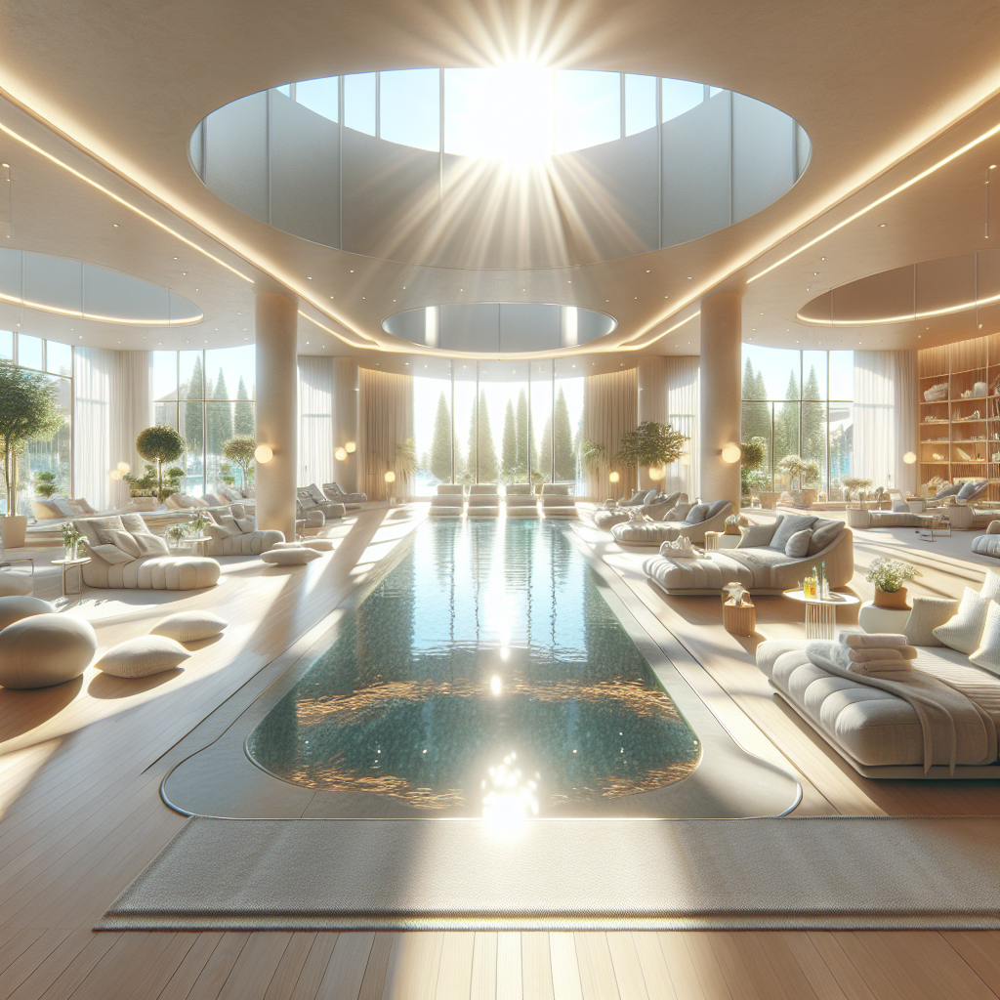

In [15]:
# Save the returning image data as a png file
import base64
image_data_base64 = response.data[0].b64_json
image_data = base64.b64decode(image_data_base64)

base_image_path = 'output/base_image.png'
with open(base_image_path, 'wb') as file:
    file.write(image_data)

# Display the base image
print(f"****** BASE IMAGE: {base_image_path} ******")
Image(filename=base_image_path)

****** MASK IMAGE: output/mask_image.png ******


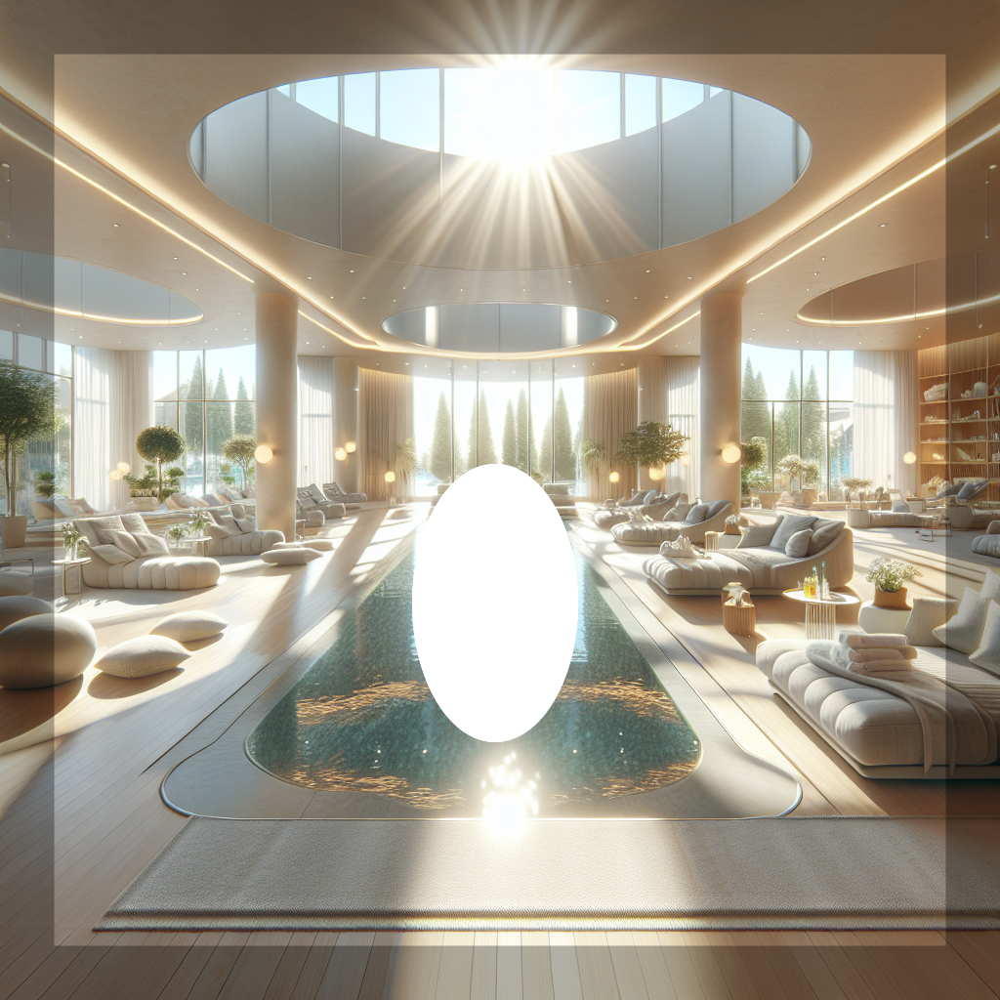

In [16]:
# NOTE: Here I duplicated the image file as 'output/mask_image.png' and manually masked the area as transparent.
mask_image_path = 'output/mask_image.png'

# Display the mask image
print(f"****** MASK IMAGE: {mask_image_path} ******")
Image(filename=mask_image_path)

In [17]:
edit_response = client.images.edit(
  model="dall-e-2",
  image=open(base_image_path, "rb"),
  mask=open(mask_image_path, "rb"),
  prompt="A sunlit indoor lounge area with a pool containing a flamingo",
  n=1,
  size="1024x1024",
  response_format="b64_json"
)
image_url = edit_response.data[0].url

****** EDITED IMAGE: output/edited_image.png ******


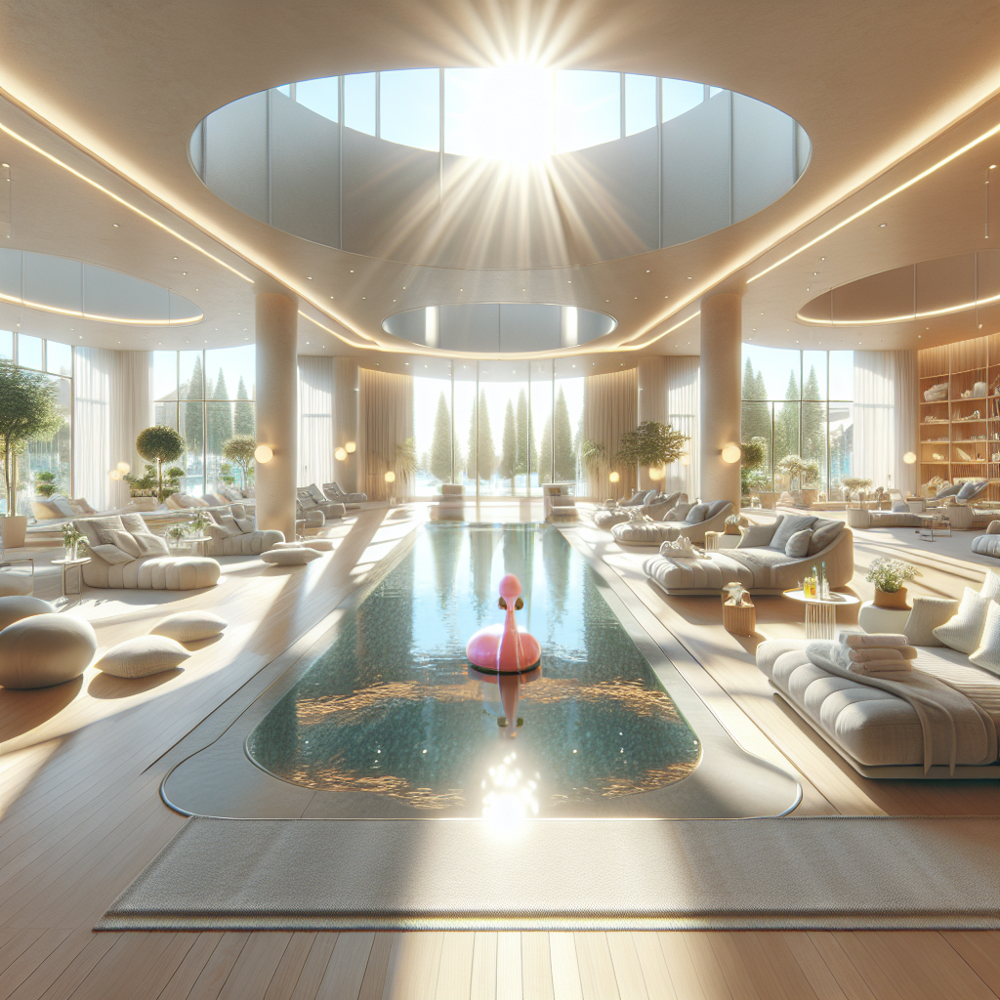

In [32]:
# Save the returning image data as a png file
import base64
image_data_base64 = edit_response.data[0].b64_json
image_data = base64.b64decode(image_data_base64)

edited_image_path = 'output/edited_image.png'
with open(edited_image_path, 'wb') as file:
    file.write(image_data)

# Display the edited image
print(f"****** EDITED IMAGE: {edited_image_path} ******")
Image(filename=edited_image_path)

## Variations (DALL·E 2 only)
The [image variations endpoint](https://platform.openai.com/docs/api-reference/images/create-variation) allows you to generate a variation of a given image.

In [31]:
variation_response = client.images.create_variation(
  image=open(base_image_path, "rb"),
  n=2,
  size="1024x1024",
  response_format="b64_json"
)

****** FIRST VARIATION ******


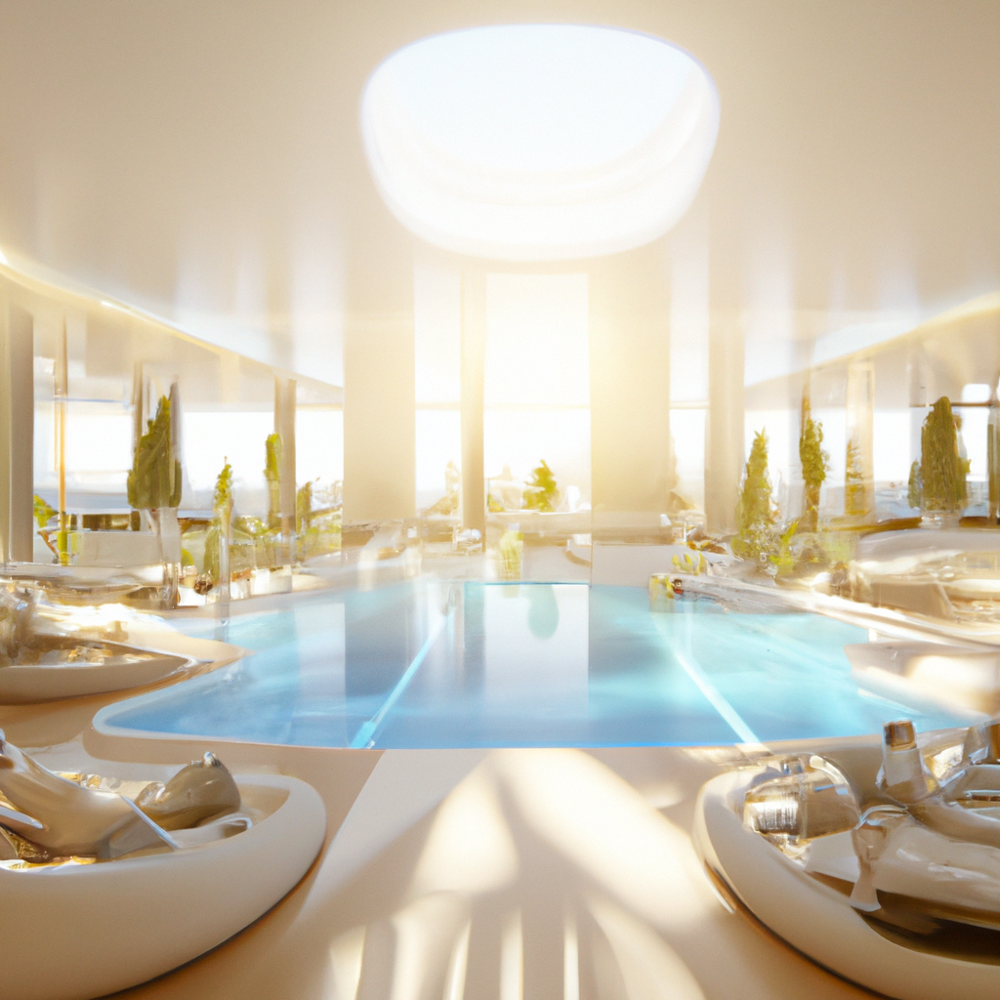

In [33]:
# Save the returning image data as a png file
import base64
image_data_base64 = variation_response.data[0].b64_json
image_data = base64.b64decode(image_data_base64)

# Display the first image
print(f"****** FIRST VARIATION ******")
Image(data=image_data)

****** SECOND VARIATION ******


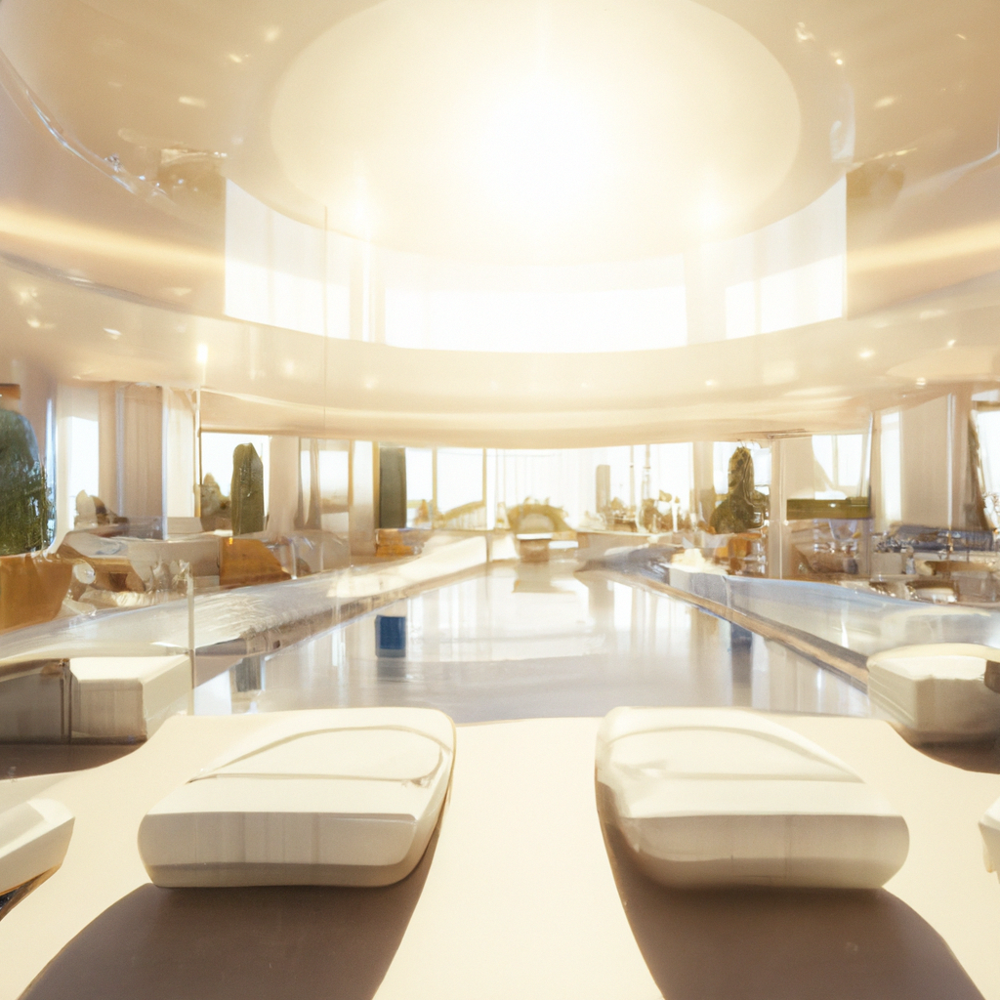

In [34]:
image_data_base64 = variation_response.data[1].b64_json
image_data = base64.b64decode(image_data_base64)

# Display the second image
print(f"****** SECOND VARIATION ******")
Image(data=image_data)

## Operating on Image Data
It may be useful to perform operations on images before passing them to the API. Here's an example that uses PIL to resize an image:

In [37]:
from io import BytesIO
from PIL import Image as PilImage
from openai import OpenAI
from IPython.display import Image
client = OpenAI()

# Read the image file from disk and resize it
image = PilImage.open(base_image_path)
image = image.resize((256, 256))

# Convert the image to a BytesIO object
byte_stream = BytesIO()
image.save(byte_stream, format='PNG')
byte_array = byte_stream.getvalue()

variation_response2 = client.images.create_variation(
  image=byte_array,
  n=1,
  model="dall-e-2",
  size="1024x1024"
)

In [38]:
# Display the variation image
print(f"****** VARIATION ******")
Image(url=variation_response2.data[0].url)

****** VARIATION ******


## Error Handling
API requests can potentially return errors due to invalid inputs, rate limits, or other issues. These errors can be handled with a `try...except` statement, and the error details can be found in `e.error`:

In [44]:
import openai

try:
  response = client.images.create_variation(
    image=open(base_image_path, "rb"),
    n=1,
    model="dall-e-24",
    size="1024x1024"
  )
  print(response.data[0].url)
except openai.OpenAIError as e:
  print(e)

Error code: 400 - {'error': {'code': None, 'message': 'Invalid model dall-e-24. The model argument should be left blank.', 'param': None, 'type': 'invalid_request_error'}}
Error code: 400 - {'error': {'code': None, 'message': 'Invalid model dall-e-24. The model argument should be left blank.', 'param': None, 'type': 'invalid_request_error'}}
